#Ponderada Pose Estimation

## Aluno: Yago Phellipe Matos Lopes
### Curso: Ciência da computação
#### RA: A2022.2A.0153

## Dataset ANIMAL-POSE DATASET



## Montando Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Instalação mediapipe

In [2]:
!pip install mediapipe


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 23.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.5 which is incompatible.


## Importações

In [3]:
import json
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter
import cv2
import math
import numpy as np
from google.colab.patches import cv2_imshow
import mediapipe as mp
from google.colab import files

## Análise exploratória

### Carregando os dados do json

In [4]:
json_path = '/content/drive/MyDrive/pose-estimation-yago/keypoints.json'

# Carregar os dados do JSON
with open(json_path, 'r') as file:
    data = json.load(file)

# Converter os dados para um DataFrame para facilitar a análise
keypoints = pd.json_normalize(data['annotations'])
keypoints.head()

,image_id,bbox,keypoints,num_keypoints,category_id
0,1,"[123, 115, 379, 275]","[[193, 216, 1], [160, 217, 1], [174, 261, 1], ...",20,1
1,2,"[25, 34, 419, 271]","[[330, 84, 1], [245, 91, 1], [290, 137, 1], [3...",20,3
2,3,"[54, 50, 285, 262]","[[275, 102, 1], [247, 105, 1], [269, 156, 1], ...",20,4
3,4,"[100, 96, 355, 324]","[[0, 0, 0], [327, 161, 1], [350, 192, 1], [333...",20,4
4,5,"[71, 252, 216, 314]","[[103, 269, 1], [86, 269, 1], [92, 284, 1], [1...",20,5


### Verificando quantos dados tem em cada categoria

In [5]:
keypoints["category_id"].value_counts()

,count
category_id,
1,1771
2,1466
3,1078
4,960
5,842


## Descobrindo quais categorias existem no dataset

In [6]:
categories = data['categories']

# Exibir as categorias e seus respectivos IDs
for category in categories:
    print(f"ID: {category['id']}, Nome: {category['name']}")

ID: 1, Nome: dog
ID: 2, Nome: cat
ID: 3, Nome: sheep
ID: 4, Nome: horse
ID: 5, Nome: cow


### Plotando gráfico com a contagem das categorias

In [17]:
category_counts = Counter(keypoints['category_id'])
categories = ['dog', 'cat', 'sheep', 'horse', 'cow']  # Supondo que estas são as categorias
category_labels = [categories[i-1] for i in category_counts.keys()]  # Ajuste conforme necessário
category_values = list(category_counts.values())

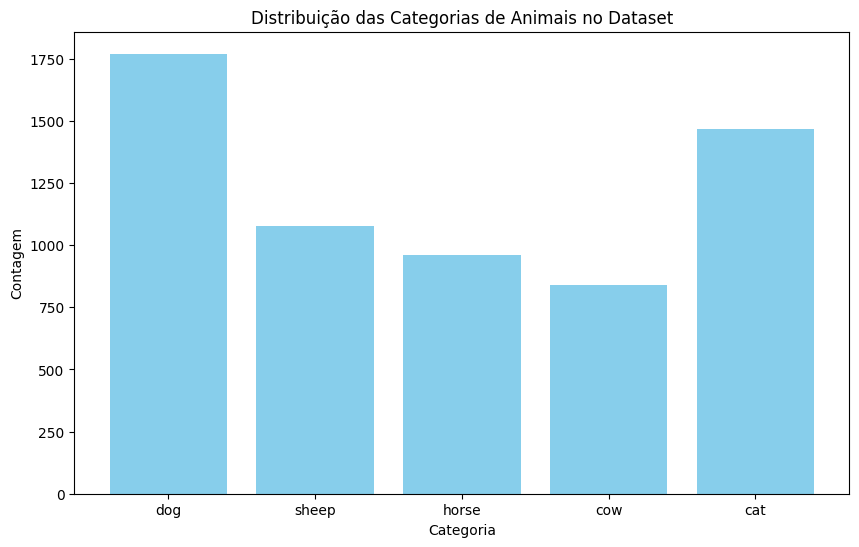

In [18]:
plt.figure(figsize=(10, 6))
plt.bar(category_labels, category_values, color='skyblue')
plt.title('Distribuição das Categorias de Animais no Dataset')
plt.xlabel('Categoria')
plt.ylabel('Contagem')
plt.show()

## Filtragem do dataset

### Filtrando para somente a categoria 5, já que queremos apenas os datasets dos bois

In [19]:
cow_category_id = 5
cow_images = keypoints[keypoints['category_id'] == cow_category_id]

# Análise Exploratória
# Contar o número de imagens de bovinos
num_cow_images = len(cow_images)
print(f'Número de imagens de bovinos: {num_cow_images}')
cow_images.head(10)

Número de imagens de bovinos: 842


,image_id,bbox,keypoints,num_keypoints,category_id
4,5,"[71, 252, 216, 314]","[[103, 269, 1], [86, 269, 1], [92, 284, 1], [1...",20,5
5,5,"[58, 202, 241, 295]","[[73, 225, 1], [0, 0, 0], [64, 240, 1], [84, 2...",20,5
6,6,"[2, 2, 459, 334]","[[0, 0, 0], [255, 46, 1], [308, 88, 1], [171, ...",20,5
7,7,"[341, 102, 500, 406]","[[363, 125, 1], [0, 0, 0], [343, 147, 1], [385...",20,5
17,16,"[237, 167, 338, 263]","[[248, 205, 1], [0, 0, 0], [238, 222, 1], [254...",20,5
20,18,"[55, 178, 149, 248]","[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [...",20,5
21,18,"[135, 176, 174, 241]","[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [...",20,5
22,18,"[227, 153, 282, 236]","[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [...",20,5
23,18,"[276, 159, 350, 255]","[[0, 0, 0], [335, 213, 1], [335, 226, 1], [0, ...",20,5
24,18,"[327, 152, 425, 240]","[[0, 0, 0], [0, 0, 0], [332, 222, 1], [0, 0, 0...",20,5


### Fazendo merge dos dataframes para conseguirmos fazer a relação das imagens com os keypoints

In [11]:
images_id = pd.json_normalize(data['images'])
[str(images_id[id]) for id in images_id]

images_dict = images_id.to_dict()

data = [ [id, images_dict[id][0]] for id in images_dict ]
collums = ["id", "image"]

image_df = pd.DataFrame(data, columns=collums)
image_df["id"] = image_df["id"].to_numpy("int64")

merge_df = image_df.merge(cow_images, how="inner", right_on='image_id', left_on='id')[[
    "id",
    "image",
    "keypoints",
    "bbox",
    "category_id"
]]
merge_df.head()

##salvar merge_df como json
merge_df.to_json('/content/drive/MyDrive/pose-estimation-yago/merge_df.json', orient='records')

In [16]:
merge_df.head(20)


,id,image,keypoints,bbox,category_id
0,5,2007_000464.jpg,"[[103, 269, 1], [86, 269, 1], [92, 284, 1], [1...","[71, 252, 216, 314]",5
1,5,2007_000464.jpg,"[[73, 225, 1], [0, 0, 0], [64, 240, 1], [84, 2...","[58, 202, 241, 295]",5
2,6,2007_000491.jpg,"[[0, 0, 0], [255, 46, 1], [308, 88, 1], [171, ...","[2, 2, 459, 334]",5
3,7,2007_000504.jpg,"[[363, 125, 1], [0, 0, 0], [343, 147, 1], [385...","[341, 102, 500, 406]",5
4,16,2007_000904.jpg,"[[248, 205, 1], [0, 0, 0], [238, 222, 1], [254...","[237, 167, 338, 263]",5
5,18,2007_001073.jpg,"[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [...","[55, 178, 149, 248]",5
6,18,2007_001073.jpg,"[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [...","[135, 176, 174, 241]",5
7,18,2007_001073.jpg,"[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [...","[227, 153, 282, 236]",5
8,18,2007_001073.jpg,"[[0, 0, 0], [335, 213, 1], [335, 226, 1], [0, ...","[276, 159, 350, 255]",5
9,18,2007_001073.jpg,"[[0, 0, 0], [0, 0, 0], [332, 222, 1], [0, 0, 0...","[327, 152, 425, 240]",5


## Começando o código do pose estimation com os dados dos bois

Nose coordinates: (127.45396792888641, 164.51257467269897)


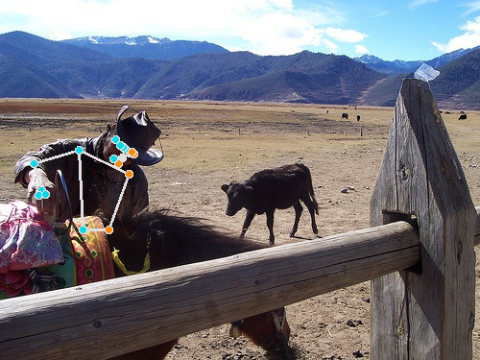

Nose coordinates: (364.47336995601654, 248.904749751091)


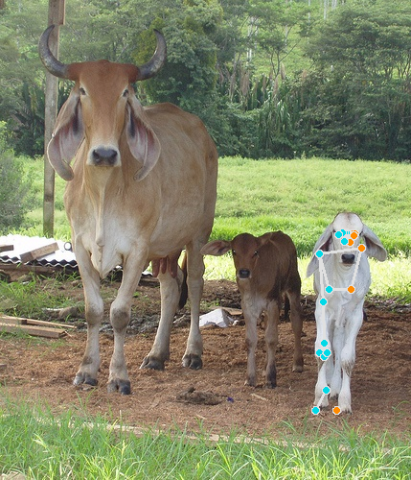

Nose coordinates: (364.47336995601654, 248.904749751091)


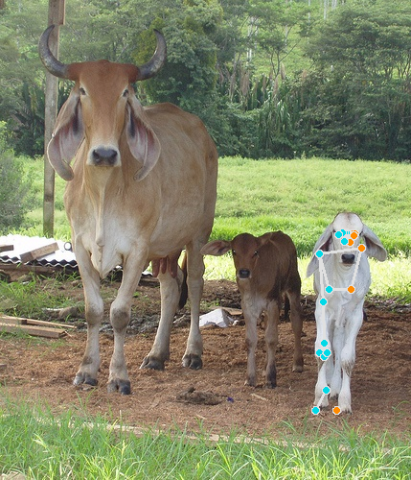

Nose coordinates: (364.47336995601654, 248.904749751091)


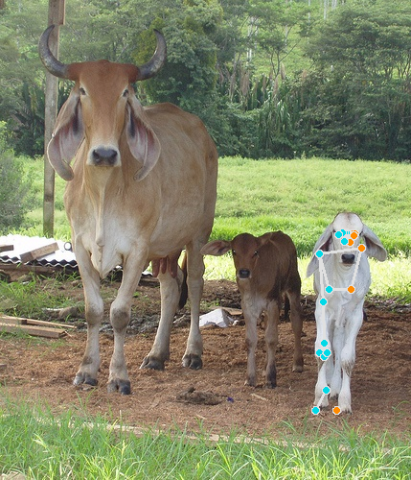

Nose coordinates: (226.41734778881073, 62.71833908557892)


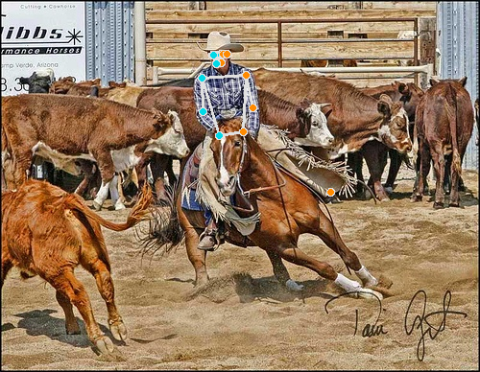

Nose coordinates: (226.41734778881073, 62.71833908557892)


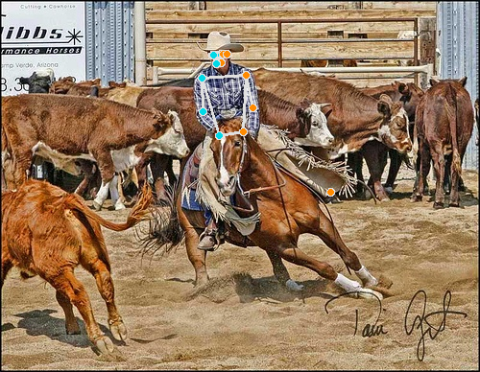

Nose coordinates: (226.41734778881073, 62.71833908557892)


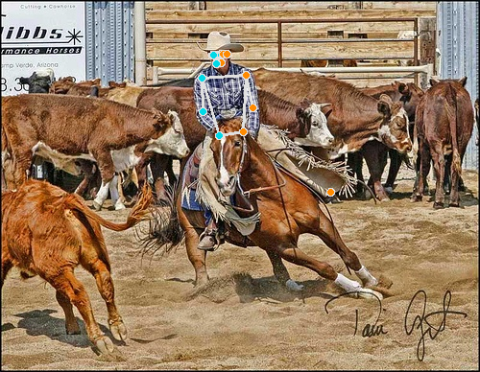

Nose coordinates: (226.41734778881073, 62.71833908557892)


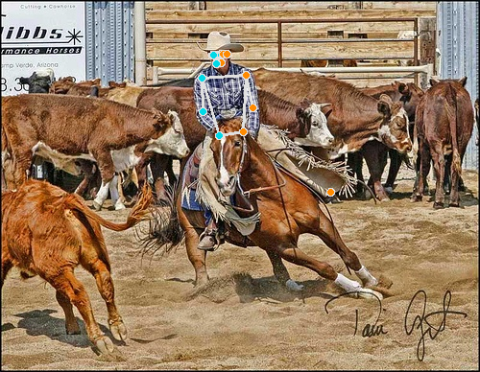

Nose coordinates: (130.02507388591766, 99.51202511787415)


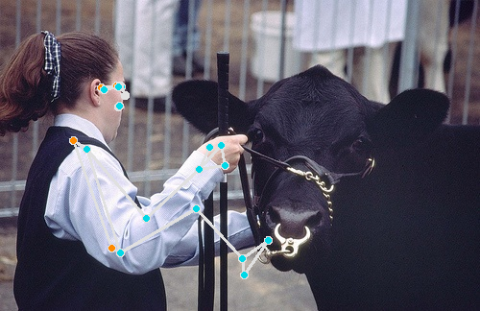

Nose coordinates: (332.5205147266388, 183.33955854177475)


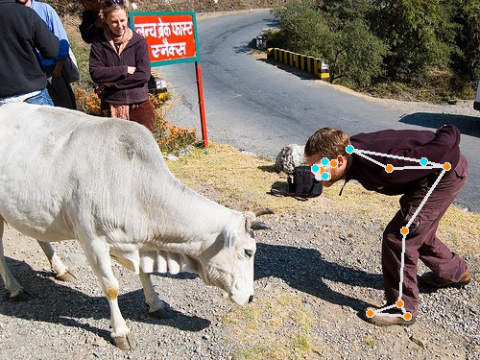

Nose coordinates: (346.9422459602356, 243.81287598609924)


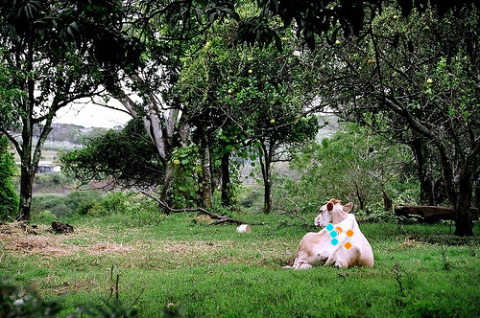

Nose coordinates: (68.68155300617218, 159.11955758929253)


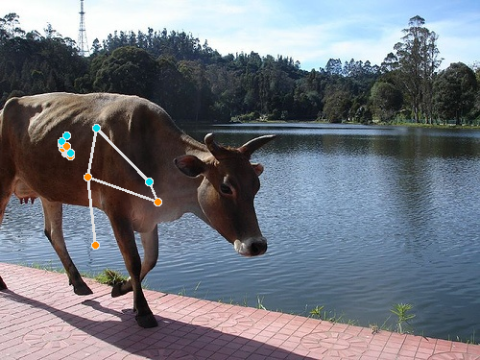

Nose coordinates: (240.8503219485283, 277.55486965179443)


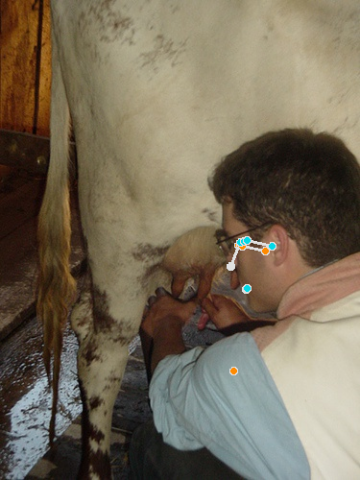

Nose coordinates: (378.8796067237854, 108.78121852874756)


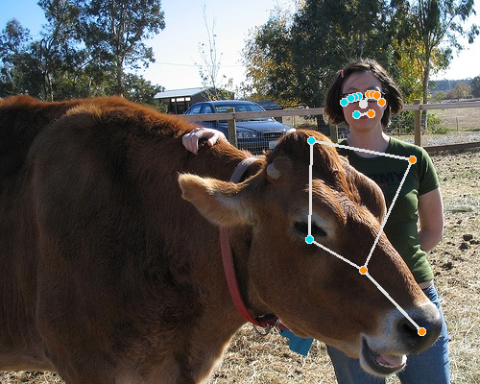

Nose coordinates: (73.27236235141754, 132.63769805431366)


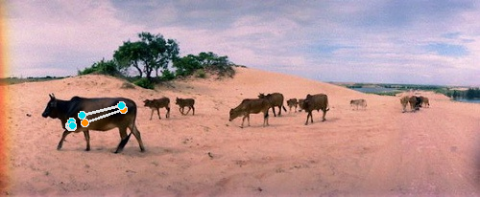

Nose coordinates: (73.27236235141754, 132.63769805431366)


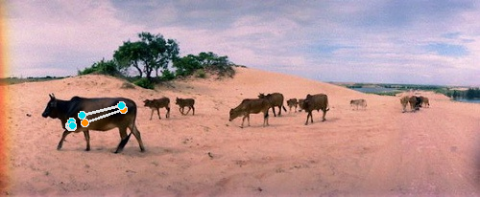

Nose coordinates: (73.27236235141754, 132.63769805431366)


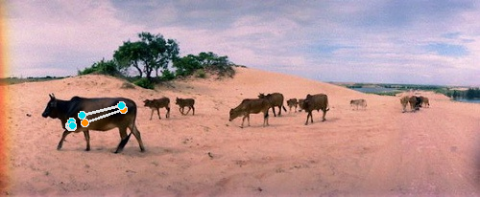

Nose coordinates: (216.1569893360138, 125.5916146337986)


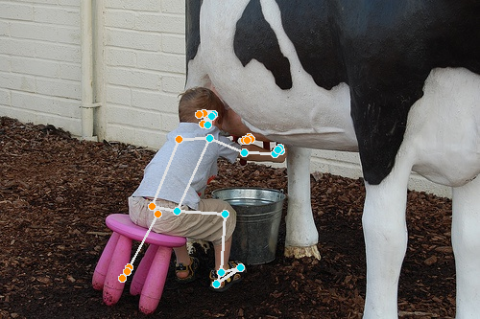

Nose coordinates: (227.39984095096588, 222.8500172495842)


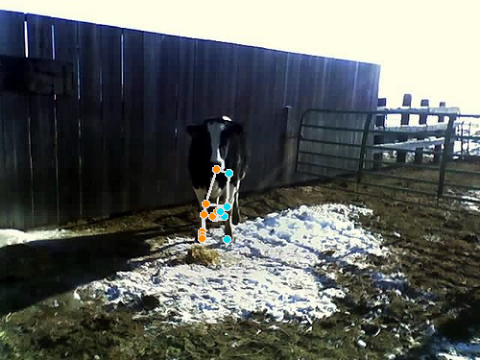

Nose coordinates: (291.18698835372925, 188.00320476293564)


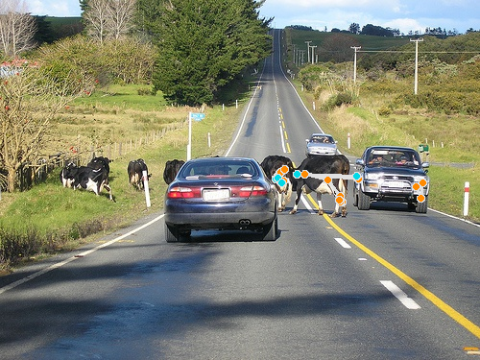

Nose coordinates: (291.18698835372925, 188.00320476293564)


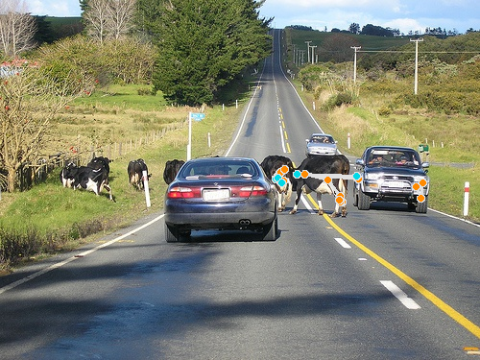

Nose coordinates: (291.18698835372925, 188.00320476293564)


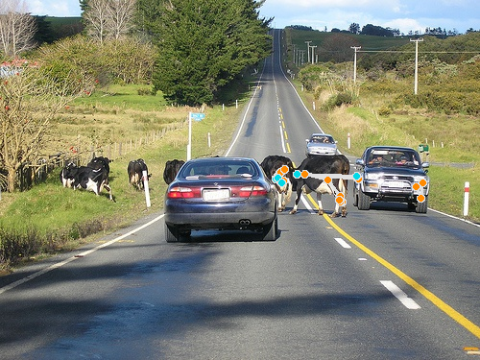

Nose coordinates: (234.76922035217285, 209.78110313415527)


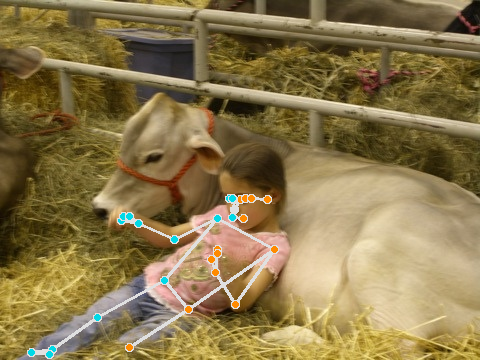

KeyboardInterrupt: 

In [15]:
##começar o pose estimation
for index, row in merge_df.iterrows():
    image_name = row["image"]  # Nome da imagem
    image_path = f'/content/drive/MyDrive/pose-estimation-yago/images/{image_name}'  # Concatenar o nome da imagem ao caminho da pasta
    image = cv2.imread(image_path)

    # Verifique se a imagem foi carregada corretamente
    if image is None:
        print(f"Erro ao carregar a imagem: {image_path}")
        continue

    DESIRED_HEIGHT = 480
    DESIRED_WIDTH = 480

    # Redimensionar e mostrar a imagem
    def resize_and_show(image):
        h, w = image.shape[:2]
        if h < w:
            img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
        else:
            img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
        cv2_imshow(img)

    # Executar MediaPipe Pose e desenhar os marcos de pose
    mp_pose = mp.solutions.pose
    mp_drawing = mp.solutions.drawing_utils
    mp_drawing_styles = mp.solutions.drawing_styles

    with mp_pose.Pose(
        static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
        # Converter a imagem BGR para RGB
        results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

        # Verificar se há marcos de pose
        if not results.pose_landmarks:
            continue

        # Exibir coordenadas do nariz
        image_height, image_width, _ = image.shape
        nose_x = results.pose_landmarks.landmark[mp_pose.PoseLandmark.NOSE].x * image_width
        nose_y = results.pose_landmarks.landmark[mp_pose.PoseLandmark.NOSE].y * image_height
        print(f'Nose coordinates: ({nose_x}, {nose_y})')

        # Desenhar os marcos de pose
        annotated_image = image.copy()
        mp_drawing.draw_landmarks(
            annotated_image,
            results.pose_landmarks,
            mp_pose.POSE_CONNECTIONS,
            landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style())
        resize_and_show(annotated_image)
